## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

In [1]:
import glob
import pickle
import numpy as np
import cv2
import matplotlib.pyplot as mpimg
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

## 1. Why using chessboard images to compute the camera calibration 
The camera reflectred off of a 3D traffic sign and forms a 2D image at a sensor. In math this transformation from 3D object points P(X, Y, Z) to 2D image points P(x, y) is done by a transformative matrix called the camera matrix **Cp** that's needed to calibrate the camera. How to calibration the camera? we can take pictures of known shapes , then We'll be able to detect and correct any distortion errors. Using a chessboard image . A chessboard is great for calibration because it's regular high contrast pattern makes it easy to detect automatically and we know what an undistorted flat chessboard looks like. So we can use the camera to take multiple pictures of a chessboard against a flat surface.Then we'll be able to detect any distortion by looking at the difference between the apparent size and the shape of the squares in these images and the size and shape that they actually are.

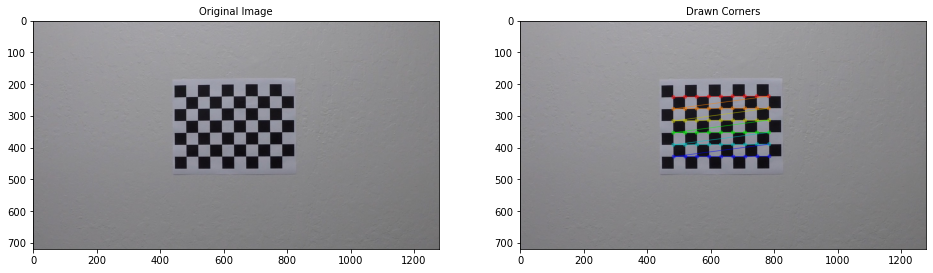

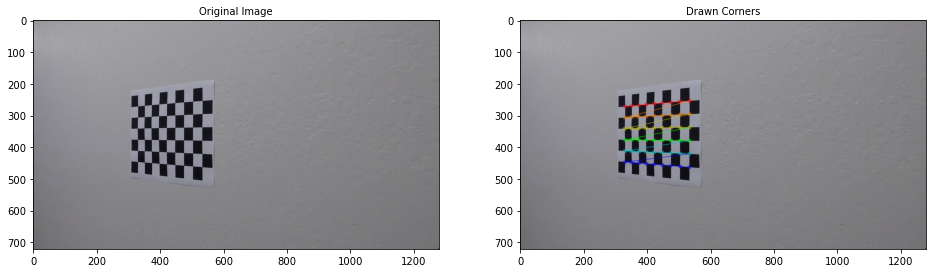

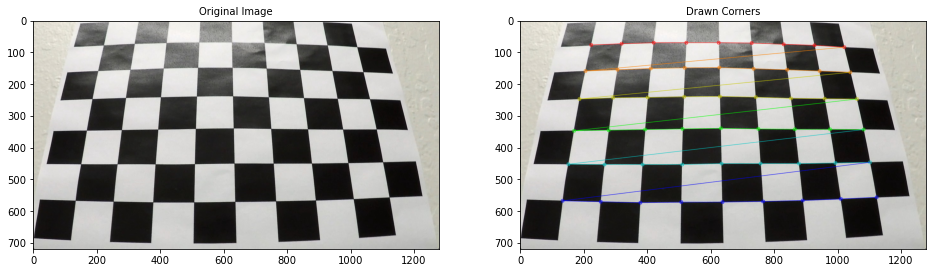

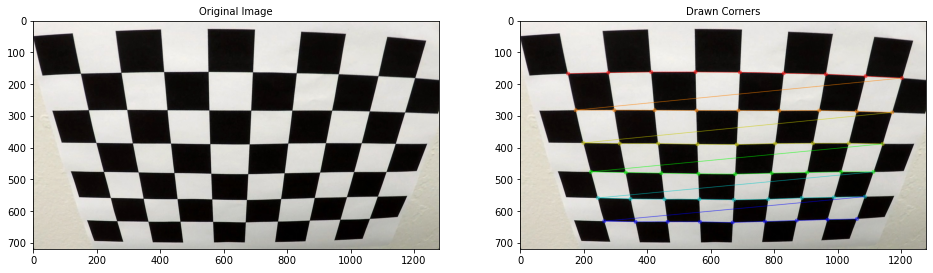

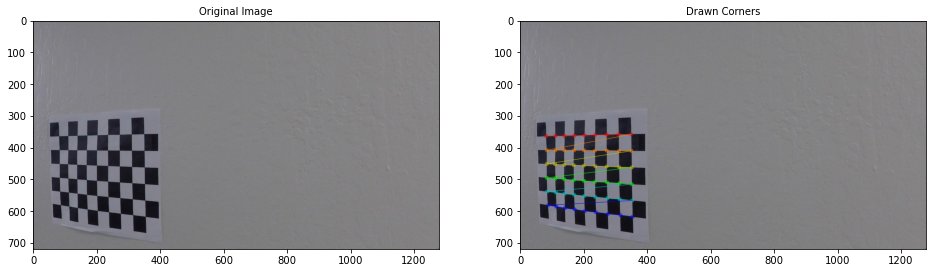

...

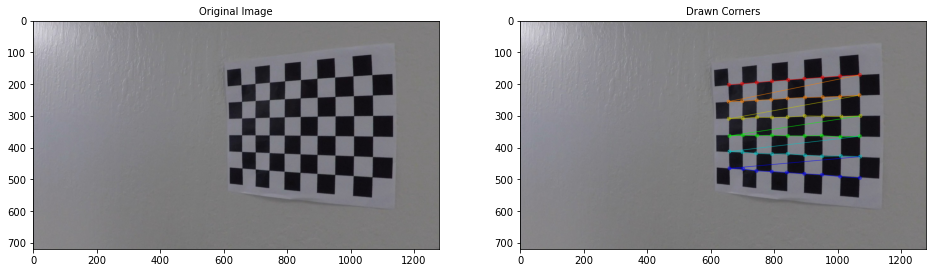

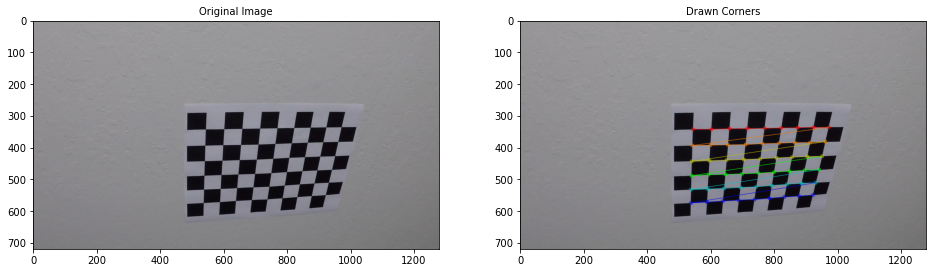

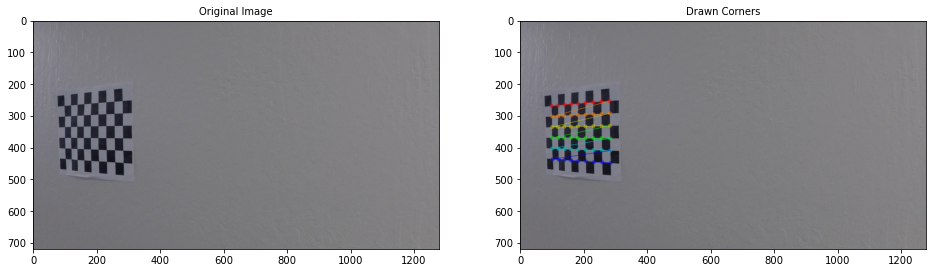

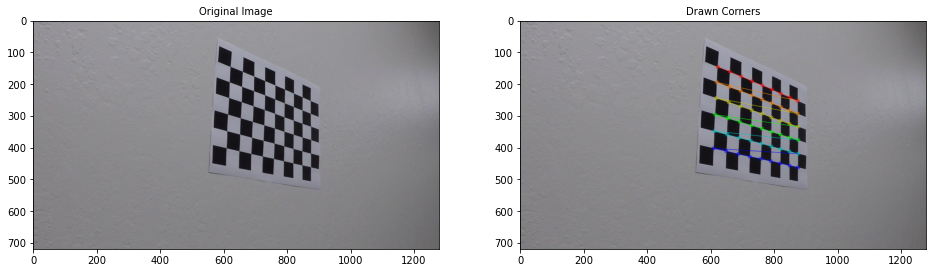

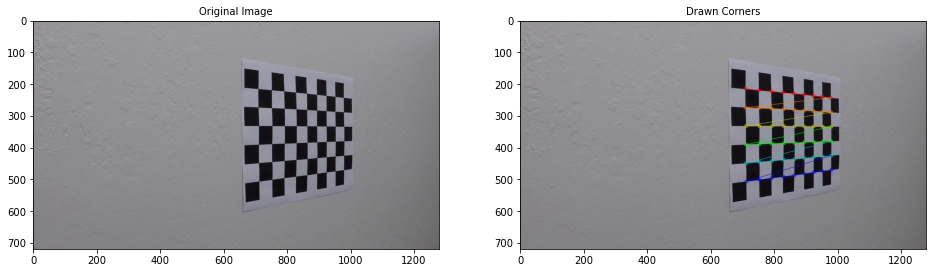

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d corners in real world space, object points
imgpoints = [] # 2d corners in image plane, image points

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners that takes image, corner dimensions and corner points
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        ax1.imshow(mpimg.imread(fname))
        ax1.set_title('Original Image', fontsize = 10)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Drawn Corners', fontsize = 10)

Next, Using the **object points** and **image points** to calibrate this camera.

## 2. Compute the camera calibration matrix and distortion coefficients given a set of object points and image points
Light rays often bend a little too much or too little at the edges of a curved lens of a camera.So there are 2 Distortion types:
- Radial Distortion
- Tangential Distortion

The distortion can generally be captured by Distortion coefficients = (k1, k2, p1, p2, k3), Those values reflect the amount of radial and tangential distortion in an image. So these coefficients can calibrate the camera and undistort the images. 

**Radial distortion correction**
$$x_{distorted} = x_{idea]}(1 + k_{[1]}r^{2} + k_{2}r^{4} + k_{3}r^{6})$$
$$y_{distorted} = y_{idea]}(1 + k_{[1]}r^{2} + k_{2}r^{4} + k_{3}r^{6})$$

**tangential distortion correction**
$$x_{corrected} = x + [2p_{1}xy + p_{2}(r^{2} + 2x^{2})]$$
$$y_{corrected} = y + [p_{1}(r^{2} + 2y^{2}) + 2p_{2}xy]$$

In [3]:
def cal_undistort(img, objpoints, imgpoints):
    img_size = (img.shape[1], img.shape[0])
    
    # Given object points and image points, get calibration matrix and distortion coefficients
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    # Correcting for distortion
    undst_img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Save undistortion image
    cv2.imwrite('output_images/undistorted_image.jpg', undst_img)
    
    # Save the camera calibration result calibration matrix and distortion coefficients
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump(dist_pickle, open('pickle/result_dist_mtx_pickle', "wb"))

    return undst_img

## 3. Apply a distortion correction to raw image

Text(0.5, 1.0, 'Undistorted Image')

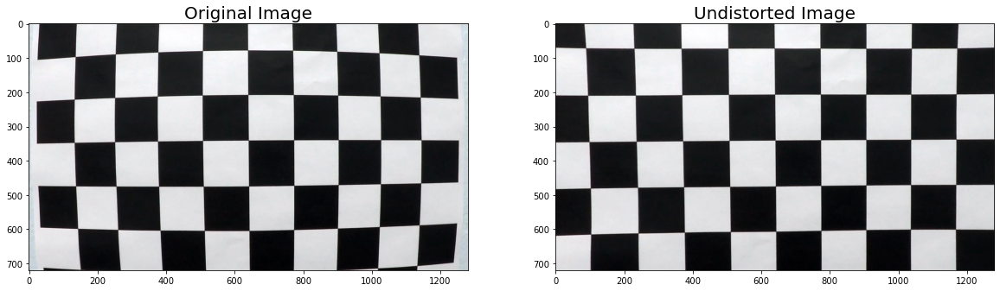

In [4]:
test_img = cv2.imread('camera_cal/calibration1.jpg')

undistorted = cal_undistort(test_img, objpoints, imgpoints)

# Visualize camera calibration result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize = 20)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize = 20)

## 4. Use color transforms, gradients to create a thresholded binary image.

#### Color transforms 
 A color space is a specific organization of colors, color spaces provide a way to categorize colors and represent them in digital images. RGB is red-green-blue color space. 
 
 <img src="src/rgb.png" style="width:300px;height:300px;">
 
 However RGB Thresholding doesn't work that well in images that include varying light conditions like the lane under extreme brightness or when lanes are a different color like yellow. These are some of the most commonly used color spaces in image analysis. HLS Color Space, This isolates the lightness or L component of each pixel in an image. And this is the component that varies the most under different lighting conditions.But the H and S channels stay fairly consistent under shadow or excessive brightness. So discard the information in the L channel, we should be able to detect different colors of lane lines more reliable than in RGB color space. 
 
 <img src="src/hls.png" style="width:600px;height:300px;">
 
H has a range from 0 to 179 for degrees around the cylindrical color space

https://docs.opencv.org/master/de/d25/imgproc_color_conversions.html

In [5]:
def hls_select(img, thresh=(180,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

<img src="src/lab.png" style="width:600px;height:600px;">
<img src="src/luv.png" style="width:600px;height:400px;">

In [6]:
# solution from knowlage Fourm for shadow image
def color_select(img, s_thresh=(90, 255), l_thresh=(150, 200), b_thresh=(225, 255)):
    s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
    b_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   

    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= l_thresh[0]) & (b_channel <= l_thresh[1])] = 1

    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= b_thresh[0]) & (l_channel <= b_thresh[1])] = 1


    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1 
    
    return  combined_binary

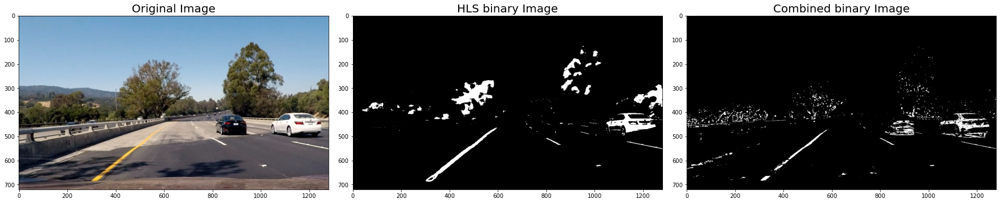

In [7]:
img = cv2.imread('test_images/test4.jpg')

hls_binary = color_select(img)

combined_binary = hls_select(img)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)

ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('HLS binary Image', fontsize=20)

ax3.imshow(combined_binary, cmap='gray')
ax3.set_title('Combined binary Image', fontsize=20)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Sobel Operator
Sobel operator is a way fo taking the derivative of the image in the x or y direction. 

$$gradient = ∑ (region * S_{x})$$

The operators for Sobelx and Sobely:

$$ S_{x} = \begin{bmatrix}
    -1  & 0  & 1\\
    -2  & 0 & 2 \\
    -1 & 0 & 1 
\end{bmatrix}\;\;\; S_{y} = \begin{bmatrix}
    -1  & -2  & -1\\
    0  & 0 & 0 \\
    1  & 2 & 1 
\end{bmatrix} \;\;\; $$


<img src="src/sobel_operator.gif" style="width:200;height:200;"> 

Taking the gradient in the x direction emphasizes edges closer to vertical, the y direction emphasizes edges closer to horizontal.

In [8]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    if orient == 'x':
        abs_soebl = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_soebl = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_soebl/np.max(abs_soebl))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output

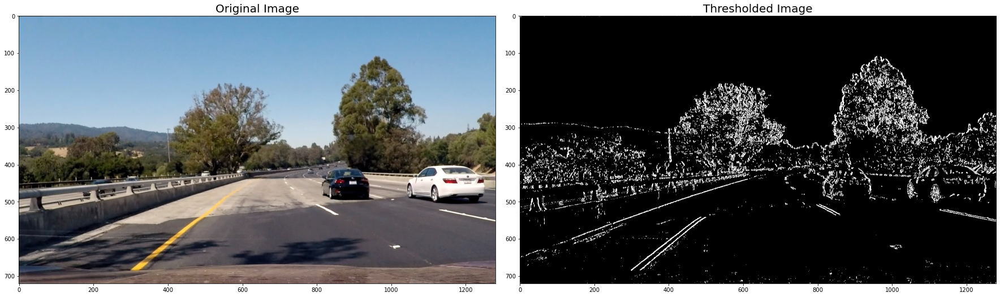

In [9]:
grad_binary = abs_sobel_thresh(img, orient='x', thresh=(20, 100))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Magnitude of the Gradient

$$abs\_sobel_{xy} = \sqrt{(sobel_{x})^{2} + (sobel_{y})^{2}}$$

In [10]:
# Calculate the magnitude of the gradient 
def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

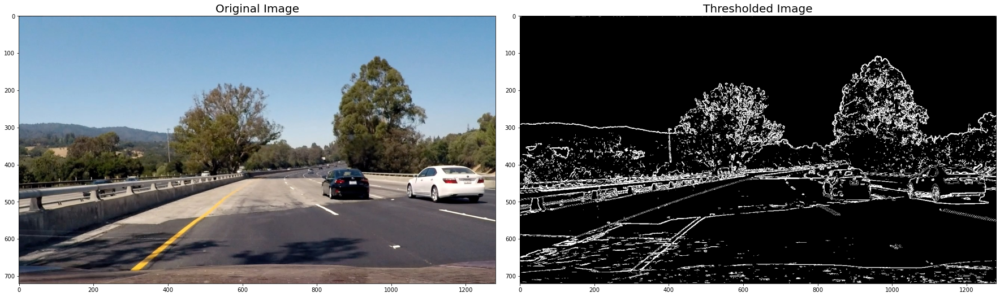

In [11]:
mag_binary = mag_threshold(img, sobel_kernel=3, mag_thresh=(30, 100))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Direction of the Gradient
In the case of lane lines, we're interested only in edges of particular orientation. The direction of the gradient is simply the inverse tangent(arctangent) of the y gradient divided by the x gradient:

$$arctan(sobel_{y}/sobel_{x})$$

In [12]:
def dir_threshold(img, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the gradient direciton
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1
    
    return binary_output

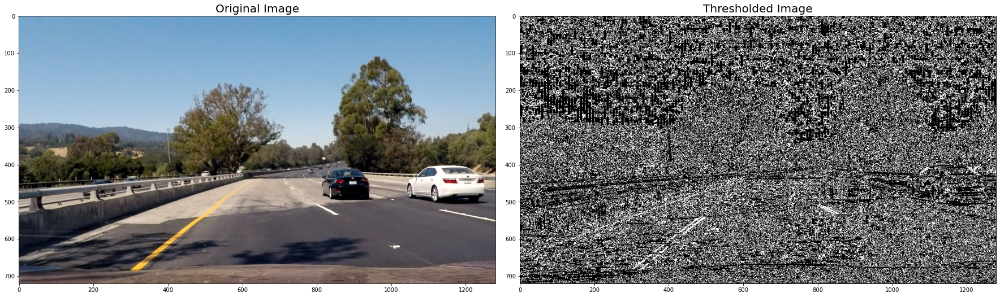

In [13]:
dir_binary = dir_threshold(img, sobel_kernel=3, dir_thresh=(0.7, 1.3))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Combining color transforms, gradients thresholds

In [14]:
def combine_thresholds(img, kernel=3, g_thresh=(20, 100), m_thresh=(30, 100),d_thresh=(0.7, 1.3)):
    
    # Calculate the x and y gradient
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel = kernel, thresh = g_thresh)
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel = kernel, thresh = g_thresh)

    # Calculate the magnitude of the gradient
    mag_binary = mag_threshold(img, sobel_kernel=kernel, mag_thresh=m_thresh)

    # Calculate direction
    dir_binary = dir_threshold(img, sobel_kernel=kernel, dir_thresh=d_thresh)
    
    # Combine thresholds
    combined = np.zeros_like(dir_binary)
    combined[ ((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # Save result 
    cv2.imwrite('output_result/binary_combo_example.jpg', np.dstack((combined,combined,combined))*255)
    
    return combined

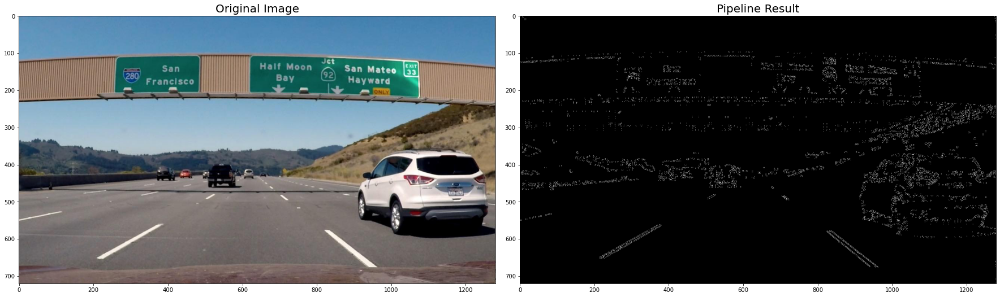

In [15]:
img = cv2.imread('test_images/signs_vehicles_xygrad.png')

hls_binary = hls_select(img, thresh=(90,255))

color_binary = np.dstack((hls_binary,hls_binary,hls_binary))

result = combine_thresholds(color_binary, g_thresh=(20, 100), m_thresh=(60, 100),d_thresh=(0.7, 1.3))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 4. Apply a perspective transform to rectify binary image ("birds-eye view")

Lane curvature is very important piece of information, Self-driving cars need to be told the correct steering angle to turn left or right and I can calculate this angle when knowing a few things about the speed and dynamics of the car and how much the lane is curving.First I'll detect the lane lines using some masking and thresholding techniques.Then, perform a perspective transform to get a birds eye view of the lane .Four points are enough to define a linear transformation from one perspective to another.

In [16]:
def cal_perspective_matrix(img):
    # (720, 1280, 3)
    height, width = img.shape[:2]
    offset = 450

    # source coordinates
    src = np.float32([[575, 465],[705,465],
                      [255,685],[1050,685]])

    # desired coordinates
    dst = np.float32([[offset, 0],[width-offset,0],
                      [offset, height],[width-offset,height]]) 
    
    # compute the perspective transform M given source and destination points
    M = cv2.getPerspectiveTransform(src, dst)
    # Compute the inverse perspective transform
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    birdseye_view_pickle = {}
    birdseye_view_pickle["M"] = M
    birdseye_view_pickle["Minv"] = Minv
    pickle.dump(birdseye_view_pickle, open('pickle/result_m_minv_pickle', "wb"))
    
    return src, dst, M, Minv

In [17]:
def convert_perspective(img):
    dist_pickle = pickle.load(open("pickle/result_dist_mtx_pickle", "rb"))
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    
    birdseye_view_pickle = pickle.load(open("pickle/result_m_minv_pickle", "rb"))
    M = birdseye_view_pickle["M"]
    
    # undistort using mtx and dist
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    img_size = (undist.shape[1], undist.shape[0])

    # Warp an image using the perspective transform, M:
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped

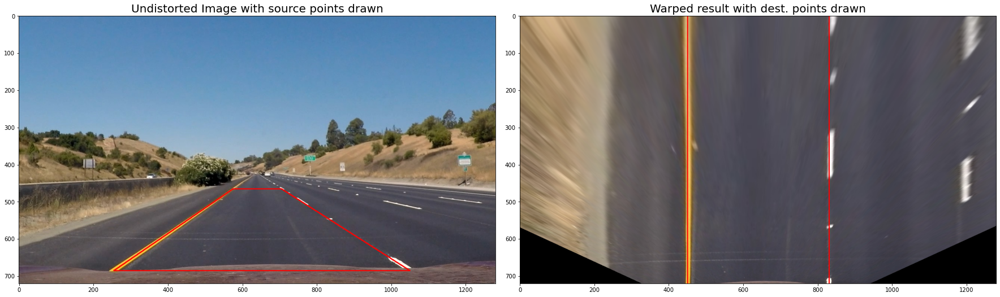

In [18]:
img = cv2.imread('test_images/straight_lines1.jpg')
img_copy = np.copy(img)
src, dst, M, Minv = cal_perspective_matrix(img)

img_warped = convert_perspective(img)
img_warped_copy = np.copy(img_warped)

points = tuple(map(tuple, src.astype(int)))
cv2.line(img_copy, points[0], points[1],(0,0,255), 2)
cv2.line(img_copy, points[1], points[3],(0,0,255), 2)
cv2.line(img_copy, points[3], points[2],(0,0,255), 2)
cv2.line(img_copy, points[2], points[0], (0,0,255),2)

points_hat = tuple(map(tuple, dst.astype(int)))
cv2.line(img_warped_copy, points_hat[1], points_hat[3],(0,0,255), 2)
cv2.line(img_warped_copy, points_hat[2], points_hat[0], (0,0,255),2)

# Save result 
cv2.imwrite('output_result/warped_straight_line_1.jpg', img_copy)
cv2.imwrite('output_result/warped_straight_line_2.jpg', img_warped_copy)

# Draw result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
ax1.set_title('Undistorted Image with source points drawn', fontsize=20)
ax2.imshow(cv2.cvtColor(img_warped_copy, cv2.COLOR_BGR2RGB))
ax2.set_title('Warped result with dest. points drawn', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 5. Detect lane pixels and fit to find the lane boundary

I'll fit a polynomial to the lane lines.So I can extract the curvature the lines from this polynomial.

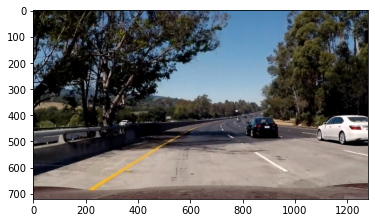

In [19]:
img = cv2.imread('test_images/test5.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB));

In [20]:
def process_pipline(img):
    img_binary = color_select(img)

    color_binary = np.dstack((img_binary, img_binary, img_binary))*255

    combine_binary = combine_thresholds(color_binary, g_thresh=(30, 255), m_thresh=(40, 255),d_thresh=(0, np.pi/8))

    img_warped = convert_perspective(combine_binary)
    
    return color_binary, combine_binary, img_warped

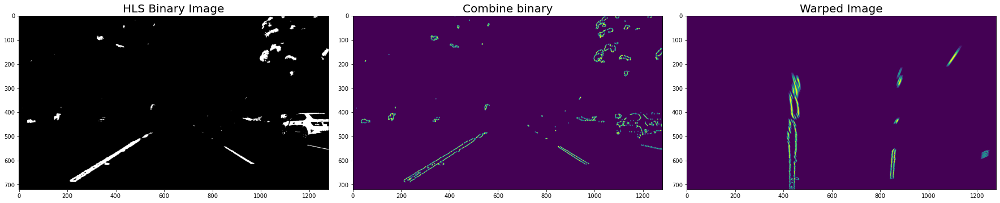

In [21]:
color_binary, combine_binary, img_warped = process_pipline(img)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()

ax1.imshow(color_binary)
ax1.set_title('HLS Binary Image', fontsize=20)

ax2.imshow(combine_binary)
ax2.set_title('Combine binary', fontsize=20)

ax3.imshow(img_warped)
ax3.set_title('Warped Image', fontsize=20)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


## 6. Determine the curvature of the lane and vehicle position with respect to center

#### Line Finding Method: Peaks in a Histogram

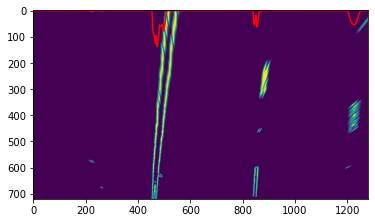

In [22]:
img = cv2.imread('test_images/test3.jpg')

_, _, img_warped = process_pipline(img)

# Grab only the bottom haff of the image
# Lane lines are likely to be mostly vertical nearest to the car
bottom_half = img_warped[img_warped.shape[0]//2:,:]

# Sum across image pixels vertically - make sure to set an 'axis'
histogram = np.sum(bottom_half, axis=0)

plt.plot(histogram, color='red');
plt.imshow(img_warped);

####  Implement Sliding Windows and Fit a Polynomial

In [23]:
def find_lane_pixels(binary_warped, visual = True):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows =10
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        if visual == True:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    # Get index where save pixel value in array 
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass
    
    # Extract left and right line pixel positions
    # Get pixels x y 
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

In [24]:
def sliding_windows_hist(binary_warped, visual = True):
    # Check is no pixels 
    if binary_warped.any() == 0:
        return None
    
    # Define lane lines max width     
    lines_max_width = 450
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, visual)
   
    if leftx.any() == 0 or lefty.any() == 0 or rightx.any() == 0 or righty.any() == 0:
        print('Not found lane line')
        return None
    
    # Fit a second order polynomial to each using `np.polyfit`
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    if(right_fitx[-1] - left_fitx[-1]) > lines_max_width:
        print(f'Found wrong lane line {right_fitx[-1] - left_fitx[-1]}')
        return None  
    
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    if visual == True:
        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
    
    return out_img, left_fitx, right_fitx, ploty
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


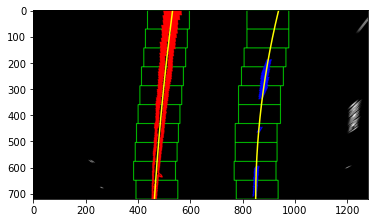

In [25]:
out_img,_,_,_ = sliding_windows_hist(img_warped)
plt.imshow(out_img);

####  Search line from Prior area

In [26]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    # while normally calculate a y-value  for a given x, here we do the opposite, 
    # why? because we expect our lane lines to be mostly vertically-oriented.
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

In [27]:
def search_around_poly(binary_warped, left_fit, right_fit):
    # Check is no pixels 
    if binary_warped.any() == 0:
        return None
    
    margin = 80

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### within the +/- margin of our polynomial function ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='red')
    plt.plot(right_fitx, ploty, color='blue')
    ## End visualization steps ##
    
    return result,left_fitx,right_fitx,ploty

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


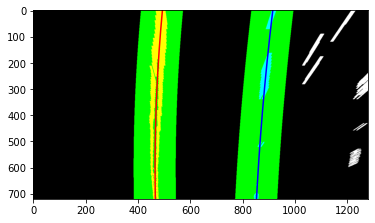

In [28]:
img = cv2.imread('test_images/test6.jpg')
_, _, img_warped = process_pipline(img)

# simulate polynomial coefficient from previous frame
leftx, lefty, rightx, righty, _ = find_lane_pixels(img_warped)
pre_left_fit = np.polyfit(lefty, leftx, 2)
pre_right_fit = np.polyfit(righty, rightx, 2)


img = cv2.imread('test_images/test1.jpg')
_, _, img_warped = process_pipline(img)

# Search from prior
result,_,_,_= search_around_poly(img_warped, pre_left_fit, pre_right_fit)
plt.imshow(result);

#### Radius of Curvature

$$f(y) = Ay^{2} + By + c$$
The line pixels fit polynomial curve , derivative chain rule and pow rule 
$$Rcurve = \frac{[1 +(\frac{dx}{dy})^{2}]^{3/2}}{|2A|} $$

$$Rcurve = \frac{[1 +(2Ay+B)^{2}]^{3/2}}{|2A|} $$

In [29]:
# def measure_curvature_real(img_shape, leftx, lefty, rightx, righty, left_fit, right_fit):

def measure_curvature_real(img, left_fitx, right_fitx, ploty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Choose point to compute curvature just in front of the car
    yvalue = img.shape[0]
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Pixels to real-world
    left_fit_converted = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_converted = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    # Compute curvature radius
    left_curv_radius = ((1 + (2*left_fit_converted[0]*yvalue + left_fit_converted[1])**2)**1.5) / (2*np.absolute(left_fit_converted[0]))
    right_curv_radius = ((1 + (2*right_fit_converted[0]*yvalue + right_fit_converted[1])**2)**1.5) / (2*np.absolute(right_fit_converted[0]))
    
    # Compute distance in meters of vehicle center from the line
    car_center = img.shape[1]/2  # we assume the camera is centered in the car
    lane_center = (left_fitx[-1] + right_fitx[-1]) / 2
    center_dist = (lane_center - car_center)* xm_per_pix
    

    return left_curv_radius, right_curv_radius, center_dist

In [30]:
img = cv2.imread('test_images/test3.jpg')

_, _, img_warped = process_pipline(img)

out_img, left_fitx, right_fitx, ploty = sliding_windows_hist(img_warped, False)

left_curverad, right_curverad, center = measure_curvature_real(img, left_fitx, right_fitx, ploty)

print(f'Result:\n\
left_curverad : {left_curverad }\n\
right_curverad: {right_curverad}\n\
center: {center}')

Result:
left_curverad : 3808.909842719208
right_curverad: 1792.5436164787614
center: 0.08559174790084431


## 7. Warp the detected lane boundaries back onto the original image

In [31]:
def draw_detected_lane(img,left_fitx,right_fitx,ploty):    
    # read Minv matrix
    birdseye_view_pickle = pickle.load(open("pickle/result_m_minv_pickle", "rb"))
    Minv = birdseye_view_pickle["Minv"]

    if Minv is None:
        _, _, _, Minv = cal_perspective_matrix(img)

    img_copy = np.copy(img)
    height, width = img_copy.shape[:2]

    # # create a canvas
    warp_zero = np.zeros_like(img).astype(np.uint8)

    # transform for vc2 fillpoly
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # fillpoly lane line 
    cv2.fillPoly(warp_zero, np.int_([pts]),(0,255,0))
    cv2.polylines(warp_zero, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=20)
    cv2.polylines(warp_zero, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=20)

    # unwarp lane line, Then add to img 
    unwarp_img = cv2.warpPerspective(warp_zero, Minv, (width, height))
    lane_img = cv2.addWeighted(img_copy, 1, unwarp_img, 0.3, 0) 

    # get lane lines information
    left_curverad, right_curverad, center = measure_curvature_real(img_copy, left_fitx, right_fitx, ploty)

    # draw lane lines information
    text_radius = 'Radius of Curvature is {} (m)'.format((left_curverad + right_curverad)//2)
    cv2.putText(lane_img, text_radius, (50,50), fontFace=cv2.FONT_HERSHEY_DUPLEX, fontScale=1, color=(0,255,0), thickness=2)

    if center > 0:
        text_center = 'Vehicle is left {:.2f} (m) of center'.format(abs(center))
    if center < 0:    
        text_center = 'Vehicle is right {:.2f} (m) of center'.format(abs(center))

    cv2.putText(lane_img, text_center, (50,100), fontFace=cv2.FONT_HERSHEY_DUPLEX, fontScale=1, color=(0,255,0), thickness=2)

    return lane_img

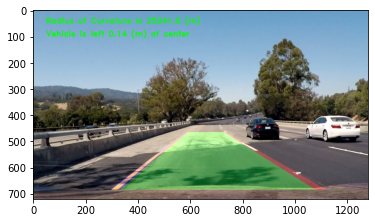

In [32]:
img = cv2.imread('test_images/test4.jpg')
_, _, img_warped = process_pipline(img)
out_img, left_fitx, right_fitx, ploty = sliding_windows_hist(img_warped, False)
lane_img = draw_detected_lane(img, left_fitx, right_fitx, ploty)
plt.imshow(cv2.cvtColor(lane_img, cv2.COLOR_BGR2RGB));

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

#### Refact all as class LaneFinding

In [33]:
class LaneFinding:
    """
    The class find the lane line
    """

    def __init__(self, g_thresh=(30, 255), m_thresh=(40, 255), d_thresh=(0, np.pi / 8),
                 sobel_kernel=3, show_birdeye=True, s_thresh=(90, 255), l_thresh=(150, 200),
                 b_thresh=(225, 255), lines_max_width=450):

        # Gradient threshold
        self.g_thresh = g_thresh
        self.m_thresh = m_thresh
        self.d_thresh = d_thresh
        self.sobel_kernel = sobel_kernel
        self.lines_max_width = lines_max_width

        # Color select
        self.s_thresh = s_thresh
        self.l_thresh = l_thresh
        self.b_thresh = b_thresh

        # Perspective Transform
        self.show_birdeye = show_birdeye
        self.birdseye_view_pickle = {}

        # Camera Calibration
        dist_pickle = pickle.load(open("pickle/result_dist_mtx_pickle", "rb"))
        self.mtx = dist_pickle["mtx"]
        self.dist = dist_pickle["dist"]

        # Process image
        self.frame = None
        self.color_binary = None
        self.combine_binary = None
        self.img_warped = None
        self.out_img = None

        self.pre_left_fitx = None
        self.pre_right_fitx = None
        self.pre_ploty = None

    def __cal_perspective_matrix(self):
        """
        Calculate the perspective matrix
        """
        height, width = self.frame.shape[:2]
        offset = 450

        # source coordinates
        src = np.float32([[575, 465], [705, 465],
                          [255, 685], [1050, 685]])

        # desired coordinates
        dst = np.float32([[offset, 0], [width - offset, 0],
                          [offset, height], [width - offset, height]])

        # compute the perspective transform M given source and destination points
        M = cv2.getPerspectiveTransform(src, dst)
        # Compute the inverse perspective transform
        Minv = cv2.getPerspectiveTransform(dst, src)

        self.birdseye_view_pickle["M"] = M
        self.birdseye_view_pickle["Minv"] = Minv

    def __color_select(self):
        """
        Select color by SLB & LUV & LAB
        Returns:
           combined_binary (np array): binary image with combined threshod
        """
        img = self.frame
        s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:, :, 2]
        l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:, :, 0]
        b_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:, :, 2]

        s_binary = np.zeros_like(s_channel)
        s_binary[(s_channel >= self.s_thresh[0]) & (s_channel <= self.s_thresh[1])] = 1

        b_thresh_min = 155
        b_thresh_max = 200
        b_binary = np.zeros_like(b_channel)
        b_binary[(b_channel >= self.l_thresh[0]) & (b_channel <= self.l_thresh[1])] = 1

        l_thresh_min = 225
        l_thresh_max = 255
        l_binary = np.zeros_like(l_channel)
        l_binary[(l_channel >= self.b_thresh[0]) & (l_channel <= self.b_thresh[1])] = 1

        combined_binary = np.zeros_like(s_binary)
        combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

        return combined_binary

    def __dir_threshold(self):
        """
        Calculate direction gradient
        Returns:
           binary_output (np array): binary image with direction gradient threshod
        """
        img = self.color_binary
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Calculate the x and y gradients
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=self.sobel_kernel)

        # Calculate the gradient direciton
        absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
        binary_output = np.zeros_like(absgraddir)
        binary_output[(absgraddir >= self.d_thresh[0]) & (absgraddir <= self.d_thresh[1])] = 1

        return binary_output

    def __mag_threshold(self):
        """
        Calculate the magnitude of the gradient
        Returns:
           binary_output (np array): Image binary matrix
        """
        img = self.color_binary

        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Calculate the x and y gradients
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=self.sobel_kernel)

        # Calculate the gradient magnitude
        gradmag = np.sqrt(sobelx ** 2 + sobely ** 2)

        # Rescale to 8 bit
        scale_factor = np.max(gradmag) / 255
        gradmag = (gradmag / scale_factor).astype(np.uint8)

        binary_output = np.zeros_like(gradmag)
        binary_output[(gradmag >= self.m_thresh[0]) & (gradmag <= self.m_thresh[1])] = 1
        return binary_output

    def __abs_sobel_thresh(self, orient='x'):
        """
        Calculate the magnitude of the gradient
        Args:
           orient(char): Sobel orientation
        Returns:
           binary_output(np arry): binary image matrix
        """

        img = self.color_binary
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        if orient == 'x':
            abs_soebl = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=self.sobel_kernel))
        if orient == 'y':
            abs_soebl = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=self.sobel_kernel))

        # Rescale back to 8 bit integer
        scaled_sobel = np.uint8(255 * abs_soebl / np.max(abs_soebl))
        binary_output = np.zeros_like(scaled_sobel)
        binary_output[(scaled_sobel >= self.g_thresh[0]) & (scaled_sobel <= self.g_thresh[1])] = 1
        return binary_output

    def __combine_thresholds(self):
        """
        Combine gradient threshold & magnitude of the gradient
        Args:
           orient(char): Sobel orientation
        Returns:
           binary_output(np arry): binary image matrix
        """
        # Calculate the x and y gradient
        gradx = self.__abs_sobel_thresh(orient='x')
        grady = self.__abs_sobel_thresh(orient='y')

        # Calculate the magnitude of the gradient
        mag_binary = self.__mag_threshold()

        # Calculate direction
        dir_binary = self.__dir_threshold()

        # Combine thresholds
        combined = np.zeros_like(dir_binary)
        combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

        return combined

    def __convert_perspective(self):
        """
        Perspective Transform
        Returns:
           warped(np arry): binary image matrix with birdeye view
        """
        dist_pickle = pickle.load(open("pickle/result_dist_mtx_pickle", "rb"))
        mtx = dist_pickle["mtx"]
        dist = dist_pickle["dist"]

        M = self.birdseye_view_pickle["M"]
        img = self.combine_binary
        # undistort using mtx and dist
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        img_size = (undist.shape[1], undist.shape[0])

        # Warp an image using the perspective transform, M:
        warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)

        return warped

    def __process_image(self):
        """
            Apply camera calibration and distortion correction
            color & gradient threshold then get perspective transform image
        """
        self.__cal_perspective_matrix()
        # Select color by SLB & LUV & LAB
        img_binary = self.__color_select()

        self.color_binary = np.dstack((img_binary, img_binary, img_binary)) * 255
        # Gradient threshold & Magnitude of the Gradient
        self.combine_binary = self.__combine_thresholds()
        # Perspective Transform
        self.img_warped = self.__convert_perspective()

    def __find_lane_pixels(self):
        """
        Perspective Transform
        Returns:
           warped(np arry): binary image matrix with birdeye view
        """

        # Take a histogram of the bottom half of the image
        histogram = np.sum(self.img_warped[self.img_warped.shape[0] // 2:, :], axis=0)
        # Create an output image to draw on and visualize the result
        out_img = np.dstack((self.img_warped, self.img_warped, self.img_warped))
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0] // 2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # HYPERPARAMETERS
        # Choose the number of sliding windows
        nwindows = 10
        # Set the width of the windows +/- margin
        margin = 80
        # Set minimum number of pixels found to recenter window
        minpix = 40

        # Set height of windows - based on nwindows above and image shape
        window_height = np.int(self.img_warped.shape[0] // nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = self.img_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated later for each window in nwindows
        leftx_current = leftx_base
        rightx_current = rightx_base

        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = self.img_warped.shape[0] - (window + 1) * window_height
            win_y_high = self.img_warped.shape[0] - window * window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            # Draw the windows on the visualization image
            cv2.rectangle(out_img, (win_xleft_low, win_y_low),
                          (win_xleft_high, win_y_high), (0, 255, 0), 2)
            cv2.rectangle(out_img, (win_xright_low, win_y_low),
                          (win_xright_high, win_y_high), (0, 255, 0), 2)

            # Identify the nonzero pixels in x and y within the window #
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                              (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                               (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        # Get index where save pixel value in array
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        # Get pixels x y
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        return leftx, lefty, rightx, righty, out_img

    def __sliding_windows_hist(self):
        # Check is no pixels
        if self.img_warped is None:
            print('__sliding_windows_hist self.img_warped is none')
            return None

        # Find our lane pixels first
        leftx, lefty, rightx, righty, out_img = self.__find_lane_pixels()

        if leftx.any() == 0 or lefty.any() == 0 or rightx.any() == 0 or righty.any() == 0:
            print(f'Not found lane pixels')
            return None

        # Fit a second order polynomial to each using `np.polyfit`

        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)

        # Generate x and y values for plotting
        ploty = np.linspace(0, self.img_warped.shape[0] - 1, self.img_warped.shape[0])
        try:
            left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
            right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1 * ploty ** 2 + 1 * ploty
            right_fitx = 1 * ploty ** 2 + 1 * ploty

        if (right_fitx[-1] - left_fitx[-1]) > self.lines_max_width:
            print(f'Found wrong lane line {right_fitx[-1] - left_fitx[-1]}')
            return None

            # Colors in the left and right lane regions
        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]

        return out_img, left_fitx, right_fitx, ploty

    def __fit_poly(self, img_shape, leftx, lefty, rightx, righty):
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])

        # while normally calculate a y-value  for a given x, here we do the opposite,
        # why? because we expect our lane lines to be mostly vertically-oriented.
        left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
        right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]

        return left_fitx, right_fitx, ploty

    def __search_around_poly(self):
        # Check is no pixels
        if self.img_warped is None:
            return None

        margin = 80

        left_fitx = self.pre_left_fitx
        right_fitx = self.pre_right_fitx
        ploty = self.pre_ploty

        if (right_fitx[-1] - left_fitx[-1]) > self.lines_max_width:
            print(f'Search_around_poly Found wrong lane line {right_fitx[-1] - left_fitx[-1]}')
            return None

        # Grab activated pixels
        nonzero = self.img_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        left_fit = np.polyfit(ploty, left_fitx, 2)
        right_fit = np.polyfit(ploty, right_fitx, 2)

        # within the +/- margin of our polynomial function
        left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy +
                                       left_fit[2] - margin)) & (nonzerox < (left_fit[0] * (nonzeroy ** 2) +
                                                                             left_fit[1] * nonzeroy + left_fit[
                                                                                 2] + margin)))
        right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy +
                                        right_fit[2] - margin)) & (nonzerox < (right_fit[0] * (nonzeroy ** 2) +
                                                                               right_fit[1] * nonzeroy + right_fit[
                                                                                   2] + margin)))

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        if leftx.any() == 0 or lefty.any() == 0 or rightx.any() == 0 or righty.any() == 0:
            print(f'search_around_poly Not found lane pixels')
            return None

        left_fitx, right_fitx, ploty = self.__fit_poly(self.img_warped.shape, leftx, lefty, rightx, righty)

        # Visualization
        # Create an image to draw on and an image to show the selection window
        self.out_img = np.dstack((self.img_warped, self.img_warped, self.img_warped)) * 255
        window_img = np.zeros_like(self.out_img)
        # Color in left and right line pixels
        self.out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        self.out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin,
                                                                        ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin,
                                                                         ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
        result = cv2.addWeighted(self.out_img, 1, window_img, 0.3, 0)

        return result, left_fitx, right_fitx, ploty

    def __measure_curvature_real(self, left_fitx, right_fitx, ploty):
        """
        Calculates the curvature of polynomial functions in meters.
        """
        # Choose point to compute curvature just in front of the car
        yvalue = self.frame.shape[0]

        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30 / 720  # meters per pixel in y dimension
        xm_per_pix = 3.7 / 700  # meters per pixel in x dimension

        # Pixels to real-world
        left_fit_converted = np.polyfit(ploty * ym_per_pix, left_fitx * xm_per_pix, 2)
        right_fit_converted = np.polyfit(ploty * ym_per_pix, right_fitx * xm_per_pix, 2)

        # Compute curvature radius
        left_curv_radius = ((1 + (2 * left_fit_converted[0] * yvalue + left_fit_converted[1]) ** 2) ** 1.5) / (
                2 * np.absolute(left_fit_converted[0]))
        right_curv_radius = ((1 + (2 * right_fit_converted[0] * yvalue + right_fit_converted[1]) ** 2) ** 1.5) / (
                2 * np.absolute(right_fit_converted[0]))

        # Compute distance in meters of vehicle center from the line
        car_center = self.frame.shape[1] / 2  # we assume the camera is centered in the car
        lane_center = (left_fitx[-1] + right_fitx[-1]) / 2
        center_dist = (lane_center - car_center) * xm_per_pix

        return left_curv_radius, right_curv_radius, center_dist

    def __draw_detected_lane(self, left_fitx, right_fitx, ploty):
        """
        Draw the lane lines and information of car position
        Args:
           left_fitx(np array): fit x pixels with left line
           right_fitx(np array): fit x pixels with right line
           ploty(np array): Sobel fit y pixels with lines
        Returns:
           lane_img(np arry): image matrix with drawn data
        """
        # Read Minv matrix
        Minv = self.birdseye_view_pickle["Minv"]

        if Minv is None:
            self.__cal_perspective_matrix()

        img_copy = np.copy(self.frame)
        height, width = img_copy.shape[:2]

        # # create a canvas
        warp_zero = np.zeros_like(img_copy).astype(np.uint8)

        # transform for vc2 fillpoly
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # fillpoly lane line
        cv2.fillPoly(warp_zero, np.int_([pts]), (0, 255, 0))
        cv2.polylines(warp_zero, np.int32([pts_left]), isClosed=False, color=(255, 0, 0), thickness=20)
        cv2.polylines(warp_zero, np.int32([pts_right]), isClosed=False, color=(0, 0, 255), thickness=20)

        # unwarp lane line, Then add to lane img
        unwarp_img = cv2.warpPerspective(warp_zero, Minv, (width, height))
        lane_img = cv2.addWeighted(img_copy, 1, unwarp_img, 0.3, 0)

        # get lane lines information
        left_curverad, right_curverad, center = self.__measure_curvature_real(left_fitx, right_fitx, ploty)

        # draw lane lines information
        text_radius = 'Radius of Curvature is {} (m)'.format((left_curverad + right_curverad) // 2)
        cv2.putText(lane_img, text_radius, (50, 50), fontFace=cv2.FONT_HERSHEY_DUPLEX, fontScale=1, color=(0, 255, 0),
                    thickness=2)
        text_center = 'Vehicle is center'

        if center > 0:
            text_center = 'Vehicle is left {:.2f} (m) of center'.format(abs(center))

        if center < 0:
            text_center = 'Vehicle is right {:.2f} (m) of center'.format(abs(center))

        cv2.putText(lane_img, text_center, (50, 100), fontFace=cv2.FONT_HERSHEY_DUPLEX, fontScale=1, color=(0, 255, 0),
                    thickness=2)

        return lane_img

    def process_video_pipline(self, frame):
        """
        process pipline
        Args:
           frame(np array:RGB): image matrix
        Returns:
           lane_img(np arry): image matrix with drawn data
        """

        # Coverted to BGR format image
        self.frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Apply camera calibration and distortion correction
        # color & gradient threshold then get perspective transform image
        self.__process_image()

        # Check lane lines pixels
        if self.img_warped is None:
            print('Check lane lines pixels is None')
            return frame

        # Find lane lines using sliding windows histgrame
        if self.pre_left_fitx is None or self.pre_right_fitx is None:
            if self.__sliding_windows_hist() is None:
                print('sliding_windows_hist is None')
                return cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            out_img, left_fitx, right_fitx, ploty = self.__sliding_windows_hist()
        else:
            if self.__search_around_poly() is None:
                print('search_around_poly is None')
                return cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            # Search from prior
            out_img, left_fitx, right_fitx, ploty = self.__search_around_poly()

        self.pre_left_fitx = left_fitx
        self.pre_right_fitx = right_fitx
        self.pre_ploty = ploty
        self.out_img = out_img
        # Draw lane lines and information
        lane_img = self.__draw_detected_lane(left_fitx, right_fitx, ploty)
        # Drawn the birdeye view
        if self.show_birdeye:
            # Add transformed images to the original image
            result = np.copy(lane_img)
            img_1 = cv2.resize(out_img, None, fx=0.25, fy=0.25, interpolation=cv2.INTER_AREA)

            # Find where to show birdeye view
            offset = 50
            endy = offset + img_1.shape[0]
            endx_img_1 = self.frame.shape[1] - offset
            startx_img_1 = endx_img_1 - img_1.shape[1]

            # Fill pixels of birdeye view image
            result[offset:endy, startx_img_1:endx_img_1] = img_1

            return cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

        return cv2.cvtColor(lane_img, cv2.COLOR_BGR2RGB)


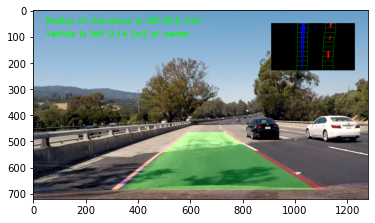

In [34]:
operator_image = LaneFinding() 
imgRGB = mpimg.imread('test_images/test4.jpg')
new_img = operator_image.process_video_pipline(imgRGB)
plt.imshow(new_img);

In [35]:
operator_video = LaneFinding()
video_output = 'output_result/video_output.mp4'
clip1 = VideoFileClip("test_video/project_video.mp4")
video_clip = clip1.fl_image(operator_video.process_video_pipline) 
%time video_clip.write_videofile(video_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_result/video_output.mp4.
Moviepy - Writing video output_result/video_output.mp4



Moviepy - Done !
Moviepy - video ready output_result/video_output.mp4
CPU times: user 12min 51s, sys: 1min 30s, total: 14min 22s
Wall time: 4min 30s


In [36]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(video_output))